<a href="https://colab.research.google.com/github/bangse94/StudyDL/blob/main/chest_xray_fanogan_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
!pip install kaggle
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"sejunepark","key":"39e1002dba3d76b0843671a0aa87c2d3"}'}

In [2]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [3]:
!kaggle datasets download -d paultimothymooney/chest-xray-pneumonia

 99% 2.27G/2.29G [00:30<00:00, 38.6MB/s]
100% 2.29G/2.29G [00:30<00:00, 81.4MB/s]


In [18]:
!unzip chest-xray-pneumonia.zip

Archive:  chest-xray-pneumonia.zip
replace chest_xray/__MACOSX/._chest_xray? [y]es, [n]o, [A]ll, [N]one, [r]ename: N
  inflating: chest_xray/test/PNEUMONIA/person100_bacteria_475.jpeg  
  inflating: chest_xray/test/PNEUMONIA/person100_bacteria_477.jpeg  
  inflating: chest_xray/test/PNEUMONIA/person100_bacteria_478.jpeg  
  inflating: chest_xray/test/PNEUMONIA/person100_bacteria_479.jpeg  
  inflating: chest_xray/test/PNEUMONIA/person100_bacteria_480.jpeg  
  inflating: chest_xray/test/PNEUMONIA/person100_bacteria_481.jpeg  
  inflating: chest_xray/test/PNEUMONIA/person100_bacteria_482.jpeg  
  inflating: chest_xray/test/PNEUMONIA/person101_bacteria_483.jpeg  
  inflating: chest_xray/test/PNEUMONIA/person101_bacteria_484.jpeg  
  inflating: chest_xray/test/PNEUMONIA/person101_bacteria_485.jpeg  
  inflating: chest_xray/test/PNEUMONIA/person101_bacteria_486.jpeg  
  inflating: chest_xray/test/PNEUMONIA/person102_bacteria_487.jpeg  
  inflating: chest_xray/test/PNEUMONIA/person103_bacter

In [19]:
!rm -r /content/chest_xray/train/PNEUMONIA/

In [34]:
from __future__ import print_function
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
manualSeed = 999
random.seed(manualSeed)
torch.manual_seed(manualSeed)

In [2]:
dataroot = "/content/chest_xray/train/"
workers = 2
batch_size = 64
image_size = 64
nc = 3
nz = 100
ngf = 64
ndf = 64
num_epochs = 20
lr = 0.0002
beta1 = 0.5
ngpu = 1
#os.listdir("../input/chest_xray/chest_xray/train/PNEUMONIA/")

In [21]:
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

In [22]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [23]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
                    )

    def forward(self, input):
        return self.main(input)

In [24]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [25]:
netG = Generator(ngpu).to(device)
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))
netG.apply(weights_init)

netD = Discriminator(ngpu).to(device)

if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))
netD.apply(weights_init)

criterion = nn.BCELoss()

fixed_noise = torch.randn(64, nz, 1, 1, device=device)
real_label = 1
fake_label = 0


optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))


img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")

for epoch in range(num_epochs):
   
    for i, data in enumerate(dataloader, 0):
        
        
        netD.zero_grad()
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device, dtype=torch.float)
        output = netD(real_cpu).view(-1)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()

        noise = torch.randn(b_size, nz, 1, 1, device=device, dtype=torch.float)
        fake = netG(noise)
        label.fill_(fake_label)
        output = netD(fake.detach()).view(-1)
        errD_fake = criterion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()

        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        output = netD(fake).view(-1)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()
        
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
        
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1

Starting Training Loop...
[0/20][0/336]	Loss_D: 1.7822	Loss_G: 6.4014	D(x): 0.3122	D(G(z)): 0.3877 / 0.0047
[0/20][50/336]	Loss_D: 0.0065	Loss_G: 8.4183	D(x): 0.9973	D(G(z)): 0.0038 / 0.0003
[0/20][100/336]	Loss_D: 0.0061	Loss_G: 20.1659	D(x): 0.9939	D(G(z)): 0.0000 / 0.0000
[0/20][150/336]	Loss_D: 0.0000	Loss_G: 34.0412	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[0/20][200/336]	Loss_D: 7.2627	Loss_G: 25.3932	D(x): 0.9997	D(G(z)): 0.9959 / 0.0000
[0/20][250/336]	Loss_D: 0.1798	Loss_G: 15.4079	D(x): 0.8448	D(G(z)): 0.0002 / 0.0000
[0/20][300/336]	Loss_D: 1.9653	Loss_G: 15.6336	D(x): 0.9840	D(G(z)): 0.7931 / 0.0000
[1/20][0/336]	Loss_D: 3.2812	Loss_G: 19.6988	D(x): 0.9774	D(G(z)): 0.9528 / 0.0000
[1/20][50/336]	Loss_D: 0.6506	Loss_G: 7.2707	D(x): 0.6280	D(G(z)): 0.0001 / 0.0019
[1/20][100/336]	Loss_D: 0.1129	Loss_G: 5.3426	D(x): 0.9330	D(G(z)): 0.0404 / 0.0059
[1/20][150/336]	Loss_D: 0.1851	Loss_G: 5.7688	D(x): 0.9899	D(G(z)): 0.1537 / 0.0057
[1/20][200/336]	Loss_D: 0.0585	Loss_G: 5.2692	D(x)

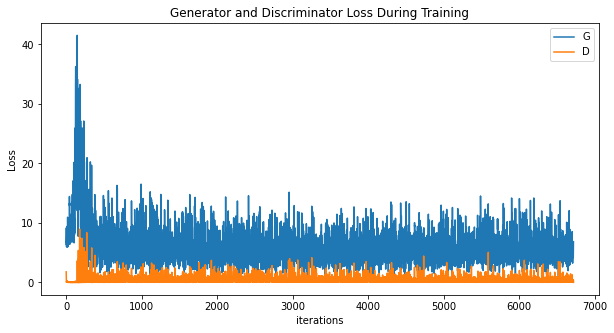

In [35]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

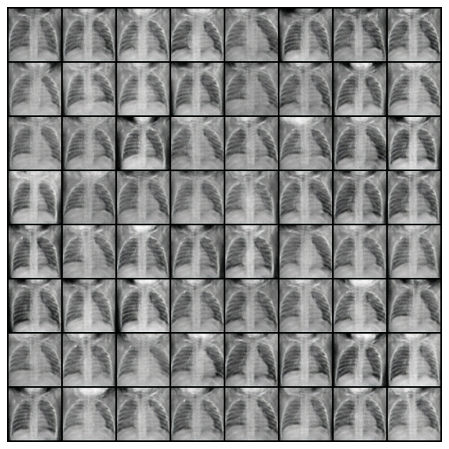

In [36]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

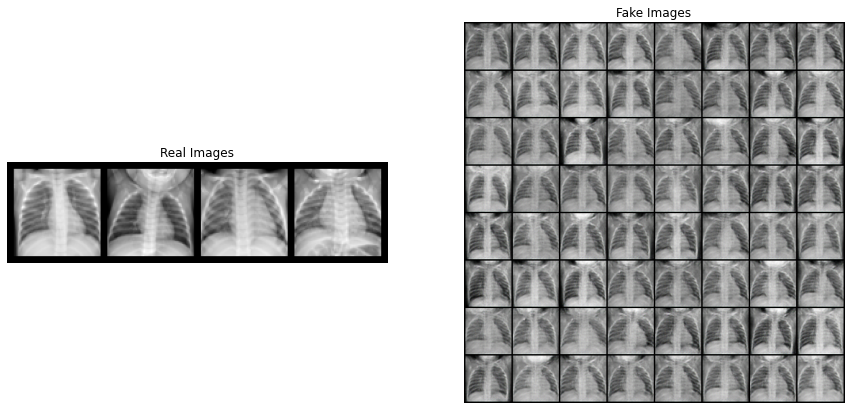

In [37]:
real_batch = next(iter(dataloader))

plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

In [16]:
class Encoder(nn.Module):
    def __init__(self, ngpu):
        super(Encoder,self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 1, 3, bias = False),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf, ndf*2, 4, 2, 1, bias = False),
            nn.BatchNorm2d(ndf*2),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf*2, ndf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*4),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf*4, ndf*8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*8),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf*8, ndf*16, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*16),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf*16, nz, 4, 2, 0, bias=False),
            nn.Tanh()
        )


    def forward(self, input):
        return self.main(input)

In [41]:
netE = Encoder(ngpu).to(device)
if (device.type == 'cuda') and (ngpu > 1):
    netE = nn.DataParallel(netE, list(range(ngpu)))
netE.apply(weights_init)

netG.eval()
netD.eval()

criterion = nn.MSELoss()

fixed_noise = torch.randn(64, nz, 1, 1, device=device)
real_label = 1
fake_label = 0


optimizerE = optim.Adam(netE.parameters(), lr=lr, betas=(beta1, 0.999))


img_list = []
E_losses = []
iters = 0

for epoch in range(num_epochs):
   
    for i, data in enumerate(dataloader, 0):
        real_image = data[0].to(device)

        optimizerE.zero_grad()
        z = netE(real_image)

        optimizerG.zero_grad()
        fake_image = netG(z)

        real_features = netD(real_image)
        fake_features = netD(fake_image)

        loss_imgs = criterion(real_image, fake_image)
        loss_features = criterion(fake_features, real_features)
        errE = loss_imgs + loss_features

        errE.backward()
        optimizerE.step()
        


        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_E: %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errE.item()))
        
        E_losses.append(errE.item())
        
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(netE(netG(fixed_noise))).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1

[0/20][0/336]	Loss_E: 0.3425
[0/20][50/336]	Loss_E: 0.2709
[0/20][100/336]	Loss_E: 0.1306
[0/20][150/336]	Loss_E: 0.1368
[0/20][200/336]	Loss_E: 0.2485
[0/20][250/336]	Loss_E: 0.2068
[0/20][300/336]	Loss_E: 0.1272
[1/20][0/336]	Loss_E: 0.2462
[1/20][50/336]	Loss_E: 0.1422
[1/20][100/336]	Loss_E: 0.3918
[1/20][150/336]	Loss_E: 0.1897
[1/20][200/336]	Loss_E: 0.3645
[1/20][250/336]	Loss_E: 0.1283
[1/20][300/336]	Loss_E: 0.1532
[2/20][0/336]	Loss_E: 0.2190
[2/20][50/336]	Loss_E: 0.3443
[2/20][100/336]	Loss_E: 0.2176
[2/20][150/336]	Loss_E: 0.1582
[2/20][200/336]	Loss_E: 0.1747
[2/20][250/336]	Loss_E: 0.1394
[2/20][300/336]	Loss_E: 0.3468
[3/20][0/336]	Loss_E: 0.1441
[3/20][50/336]	Loss_E: 0.3841
[3/20][100/336]	Loss_E: 0.1759
[3/20][150/336]	Loss_E: 0.1700
[3/20][200/336]	Loss_E: 0.2849
[3/20][250/336]	Loss_E: 0.1352
[3/20][300/336]	Loss_E: 0.2675
[4/20][0/336]	Loss_E: 0.3916
[4/20][50/336]	Loss_E: 0.2191
[4/20][100/336]	Loss_E: 0.1591
[4/20][150/336]	Loss_E: 0.2105
[4/20][200/336]	Loss_E:

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Encoder Loss During Training")
plt.plot(G_losses,label="E")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [1]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

NameError: ignored

In [ ]:
real_batch = next(iter(dataloader))

plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

['NORMAL', 'PNEUMONIA']
{'NORMAL': 0, 'PNEUMONIA': 1}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
NORMAL
PNEUMONIA
PNEUMONIA
NORMAL
NORMAL
NORMAL
PNEUMONIA
NORMAL
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


NORMAL
NORMAL
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


NORMAL
NORMAL
PNEUMONIA
NORMAL
NORMAL
PNEUMONIA
NORMAL
NORMAL
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
NORMAL
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
NORMAL


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


NORMAL
PNEUMONIA
NORMAL
NORMAL
NORMAL
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
NORMAL
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PNEUMONIA
NORMAL
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
NORMAL
NORMAL
NORMAL
NORMAL
NORMAL
PNEUMONIA


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PNEUMONIA
PNEUMONIA
NORMAL
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PNEUMONIA
PNEUMONIA
NORMAL
NORMAL
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
NORMAL
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


NORMAL
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
NORMAL


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


NORMAL
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


NORMAL
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


NORMAL
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



NORMAL
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
NORMAL
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
NORMAL
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PNEUMONIA
PNEUMONIA
NORMAL
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
NORMAL
NORMAL
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
NORMAL
NORMAL
NORMAL
PNEUMONIA
NORMAL
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


NORMAL
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


NORMAL
NORMAL
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
NORMAL
NORMAL
PNEUMONIA
PNEUMONIA


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
NORMAL
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
NORMAL
NORMAL
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PNEUMONIA
PNEUMONIA
NORMAL
NORMAL
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
NORMAL
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


NORMAL
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
NORMAL


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
NORMAL
NORMAL
NORMAL
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
NORMAL
PNEUMONIA
NORMAL


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
NORMAL
NORMAL
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
NORMAL
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
NORMAL
PNEUMONIA
NORMAL
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


NORMAL
NORMAL
NORMAL
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


NORMAL
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
NORMAL
PNEUMONIA


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


NORMAL
PNEUMONIA
NORMAL
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
NORMAL
NORMAL
NORMAL
PNEUMONIA
PNEUMONIA


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
PNEUMONIA
PNEUMONIA
PNEUMONIA
NORMAL
NORMAL
PNEUMONIA
PNEUMONIA
NORMAL


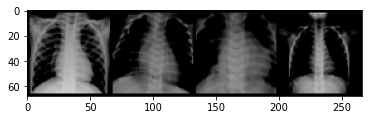

In [40]:
test_dataset = dset.ImageFolder(root='/content/chest_xray/test/',
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

def imshow(img):
    np_img = img.numpy()
    plt.imshow(np.transpose(np_img, (1,2,0)))

classes = ('NORMAL', 'PNEUMONIA')
print(test_dataset.classes)
print(test_dataset.class_to_idx)
for img, label in test_dataloader:
    imshow(torchvision.utils.make_grid(img))
    for i in range(batch_size):
        print(classes[label.numpy()[i]]
)
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

In [ ]:
def compare_images(real_img, generated_img, i, score, reverse=False, threshold=50):
    real_img = real_img.cpu().data.numpy()
    generated_img = generated_img.cpu().data.numpy()

    negative = np.zeros_like(real_img)

    if not reverse:
        diff_img = real_img - generated_img
    else:
        diff_img = generated_img - real_img
    
    diff_img[diff_img <= threshold] = 0

    anomaly_img = np.zeros_like(real_img)
    anomaly_img[:, :, 0] = real_img - diff_img
    anomaly_img[:, :, 1] = real_img - diff_img
    anomaly_img[:, :, 2] = real_img - diff_img
    anomaly_img[:, :, 0] = anomaly_img[:,:,0] + diff_img
    anomaly_img = anomaly_img.astype(np.uint8)

    fig, plots = plt.subplots(1, 4)
    fig.suptitle(f'Anomaly - (anomaly score: {score:.4})')
    
    fig.set_figwidth(9)
    fig.set_tight_layout(True)
    plots = plots.reshape(-1)
    plots[0].imshow(real_img, cmap='gray', label='real')
    plots[1].imshow(generated_img, cmap='gray')
    plots[2].imshow(diff_img, cmap='gray')
    plots[3].imshow(anomaly_img)
    
    plots[0].set_title('real')
    plots[1].set_title('generated')
    plots[2].set_title('difference')
    plots[3].set_title('Anomaly Detection')
    plt.show()

In [ ]:
criterion = nn.MSELoss()
netG.eval()
netD.eval()
netE.eval()

with open("score.csv", "w") as f:
        f.write("label, img_distance,anomaly_score,z_distance\n")

for i, data in enumerate(test_dataloader,0):
    real_img = data[0].to(device)

    real_z = netE(real_img) # 진짜 이미지의 latent vector
    fake_img = netG(real_z) # G에 넣어서 가짜 이미지 생성.
    fake_z = netE(fake_img) # torch.Size([1, 100]) --> latent 진짜 이미지와 매핑된 가짜 이미지의 latent vector

    real_feature = netD(real_img) # 1, 256
    fake_feature = netD(fake_img)
    real_feature = real_feature / real_feature.max()
    fake_feature = fake_feature / fake_feature.max()
    # print("real_feature max : ",real_feature.max())
    # print("real_feature min : ",real_feature.min())
    # print("fake_feature max : ",fake_feature.max())
    # print("fake_feature min : ",fake_feature.min())

    img_distance = criterion(fake_img, real_img)
    loss_feature = criterion(fake_feature, real_feature)

    anomaly_score = img_distance + loss_feature

    z_distance = criterion(fake_z, real_z)
    
    with open("score.csv", "a") as f:
            f.write(f"{data[1].item()}{img_distance},"
                    f"{anomaly_score},{z_distance}\n")
    
    if i % 2000 == 0:
        print(f"{img_distance}, "
          f"{anomaly_score}, {z_distance}\n")
        #compare_images(real_img, fake_img,i, anomaly_score, reverse = False, threshold = 80)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.metrics import roc_curve, precision_recall_curve, auc

In [ ]:
df = pd.read_csv("score.csv")
df